# Лабораторная работа №2: Визуализация данных

Yelp — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

---

yelp_academic_dataset_business.json
| Признак      | Описание                                  | Тип     |
| ------------ | ----------------------------------------- | ------- |
| business_id  | Уникальный идентификатор компании         | object  |
| name         | Название компании                         | object  |
| address      | Адрес компании                            | object  |
| city         | Город, в котором находится компания       | object  |
| state        | Штат, в котором находится компания        | object  |
| postal_code  | Почтовый индекс                           | object  |
| latitude     | Широта                                    | float64 |
| longitude    | Долгота                                   | float64 |
| stars        | Рейтинг компании (от 1 до 5)              | float64 |
| review_count | Количество отзывов                        | int64   |
| is_open      | Статус работы компании (1 — да, 0 — нет)  | int64   |
| attributes   | Атрибуты компании (например, доступность) | object  |
| categories   | Категории услуг компании                  | object  |
| hours        | Часы работы компании                      | object  |

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import scipy.stats as stats
from matplotlib.widgets import Slider
from ipywidgets import interact, widgets
from scipy import stats

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')

In [2]:
data_business = pd.read_json(r'..\lab1\yelp_academic_dataset_business.json', lines=True)

## `Matplotlib`

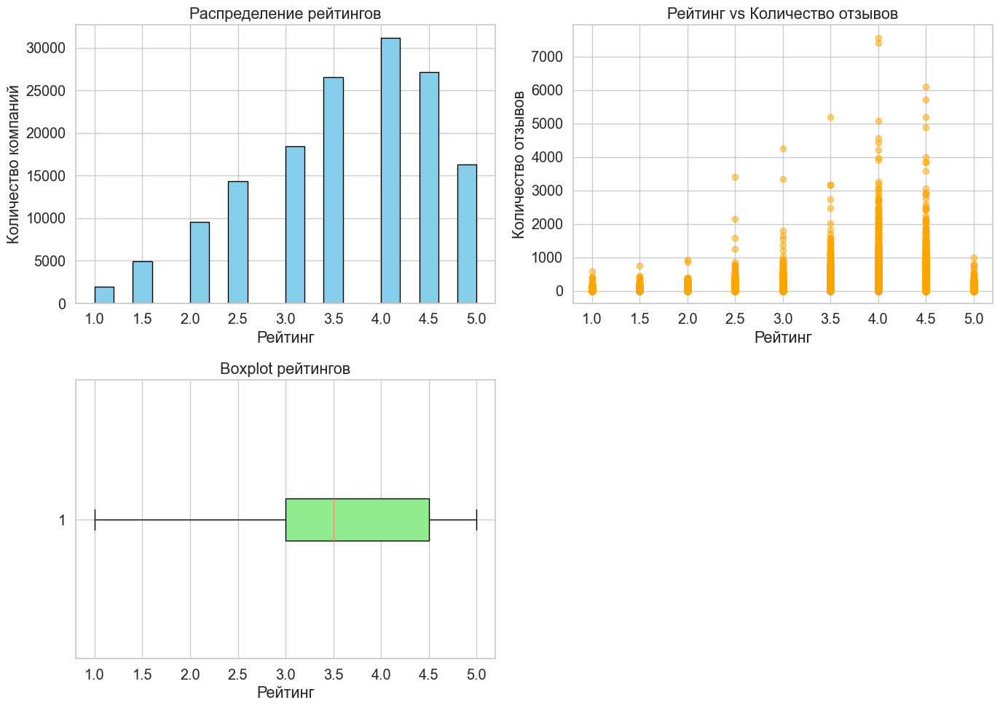

In [3]:
plt.figure(figsize=(14, 10))

# График 1: Гистограмма распределения рейтингов
plt.subplot(2, 2, 1)  # 2 строки, 2 столбца, 1-й график
plt.hist(data_business['stars'], bins=20, color='skyblue', edgecolor='black')
plt.title('Распределение рейтингов')
plt.xlabel('Рейтинг')
plt.ylabel('Количество компаний')

# График 2: Точечный график рейтинг vs количество отзывов
plt.subplot(2, 2, 2)  # 2 строки, 2 столбца, 2-й график
plt.scatter(data_business['stars'], data_business['review_count'], alpha=0.5, color='orange')
plt.title('Рейтинг vs Количество отзывов')
plt.xlabel('Рейтинг')
plt.ylabel('Количество отзывов')

# График 3: Boxplot для рейтингов
plt.subplot(2, 2, 3)  # 2 строки, 2 столбца, 3-й график
plt.boxplot(data_business['stars'], vert=False, patch_artist=True, boxprops=dict(facecolor='lightgreen'))
plt.title('Boxplot рейтингов')
plt.xlabel('Рейтинг')

# Улучшаем расположение графиков
plt.tight_layout()

# Показываем график
plt.show()


In [4]:
def update_plot(min_reviews):
    filtered = data_business[data_business['review_count'] >= min_reviews]
    
    plt.figure(figsize=(10, 6))
    plt.scatter(filtered['stars'], filtered['review_count'], alpha=0.5, color='green')
    
    plt.ylim(0, data_business['review_count'].max())  # Устанавливаем фиксированный диапазон для оси Y
    
    plt.title(f'Рейтинг vs Отзывы (мин. отзывов: {min_reviews})')
    plt.xlabel('Рейтинг')
    plt.ylabel('Количество отзывов')
    
    plt.show()

interact(update_plot, min_reviews=widgets.IntSlider(min=0, max=5000, step=50, value=1000))


interactive(children=(IntSlider(value=1000, description='min_reviews', max=5000, step=50), Output()), _dom_cla…

<function __main__.update_plot(min_reviews)>

## `Pandas`

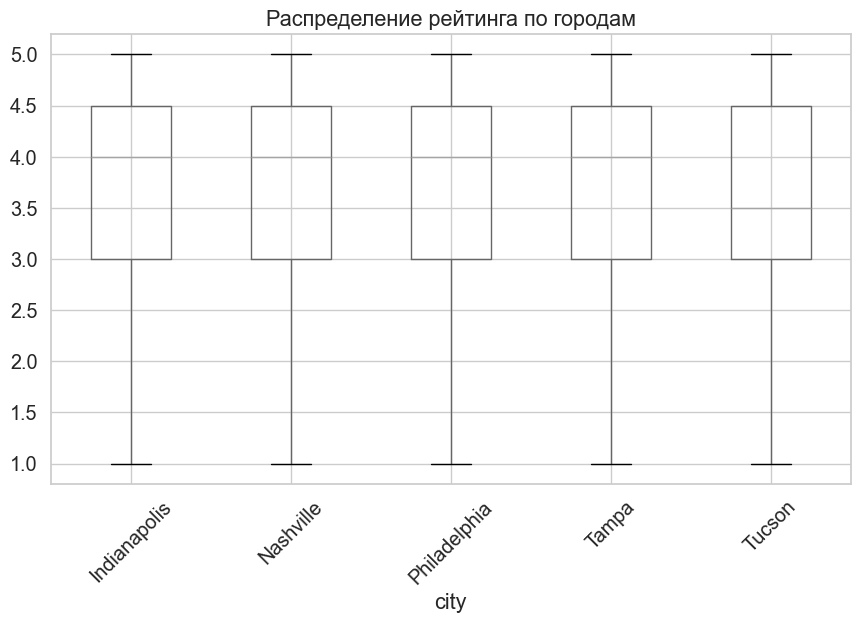

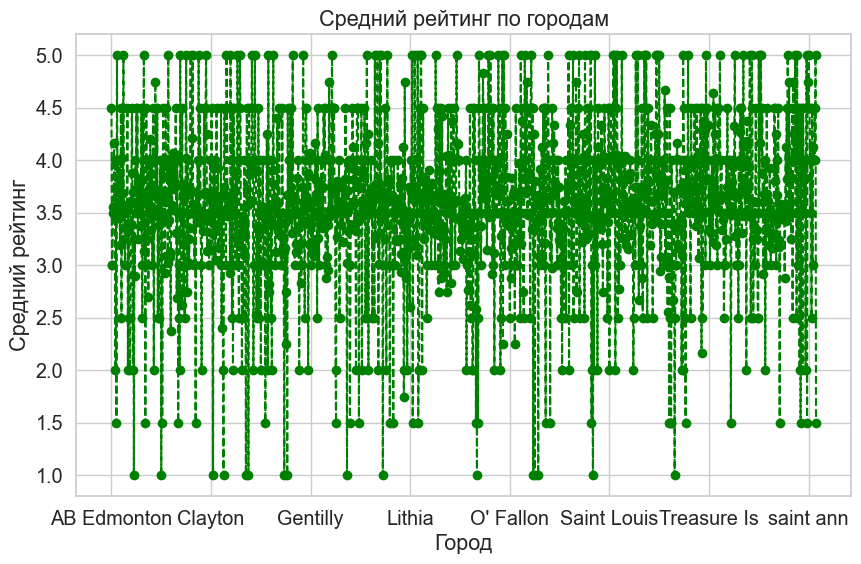

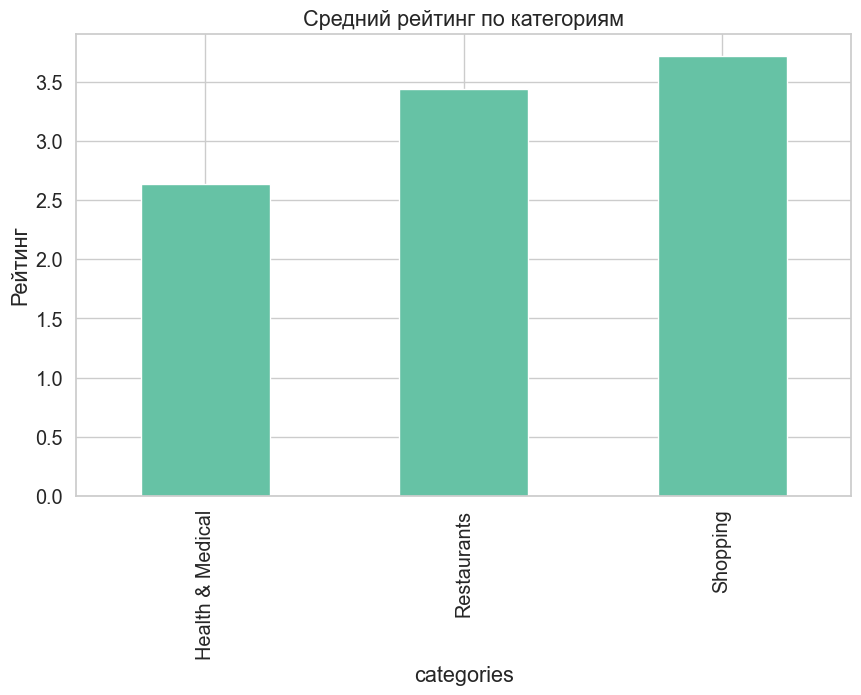

In [5]:
# Boxplot рейтинга по городам (топ-5 городов)
top_cities = data_business['city'].value_counts().head(5).index
filtered = data_business[data_business['city'].isin(top_cities)]
filtered.boxplot(column='stars', by='city', figsize=(10, 6), rot=45)
plt.title('Распределение рейтинга по городам')
plt.suptitle('')
plt.show()

# Гистограмма количества отзывов (через Series)
average_rating_by_city = data_business.groupby('city')['stars'].mean()
average_rating_by_city.plot(kind='line', marker='o', figsize=(10, 6), color='green', linestyle='--')
plt.title('Средний рейтинг по городам')
plt.xlabel('Город')
plt.ylabel('Средний рейтинг')
plt.grid(True)
plt.show()


sample_categories = ['Restaurants', 'Shopping', 'Health & Medical']
filtered = data_business[data_business['categories'].isin(sample_categories)]
mean_ratings = filtered.groupby('categories')['stars'].mean()
mean_ratings.plot(kind='bar', figsize=(10, 6))
plt.title('Средний рейтинг по категориям')
plt.ylabel('Рейтинг')
plt.show()


## `Seaborn`

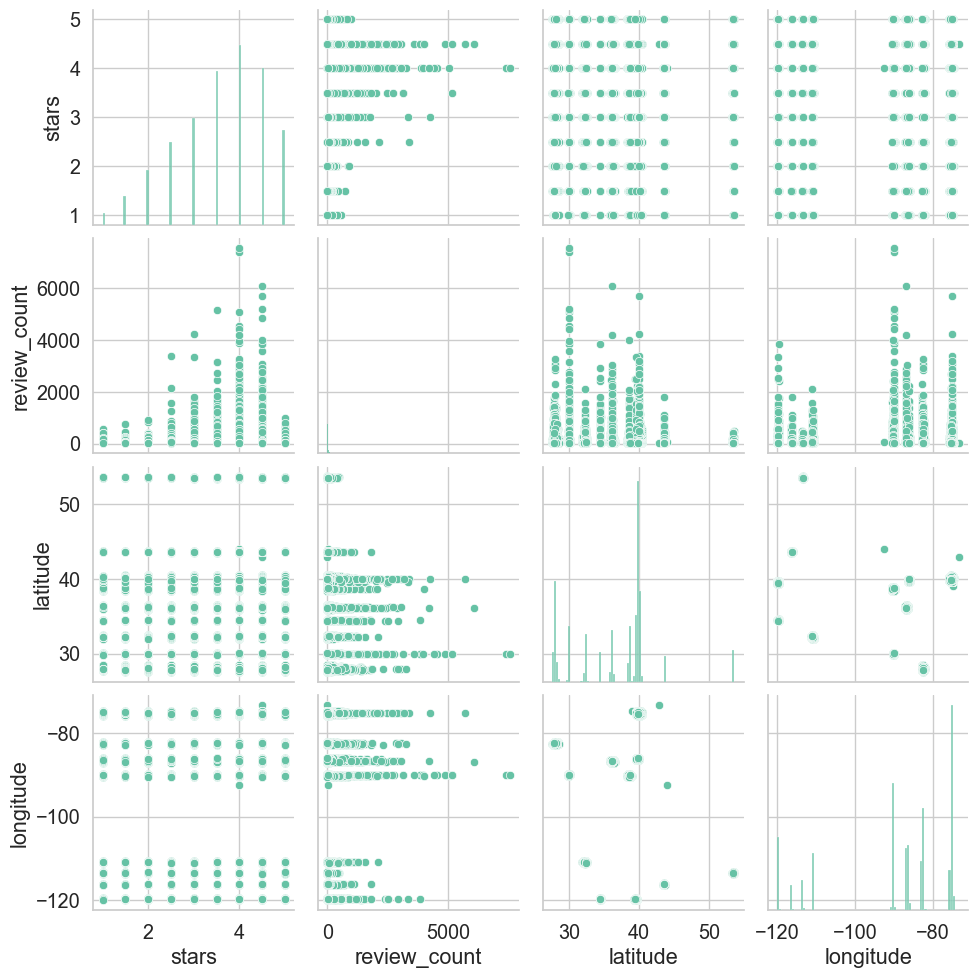

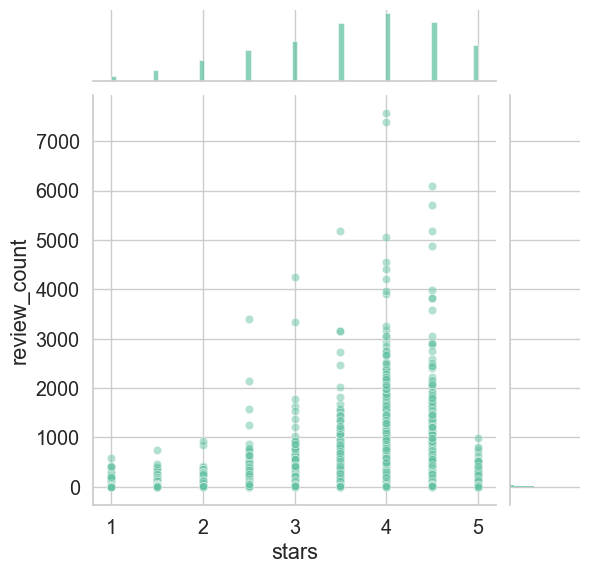

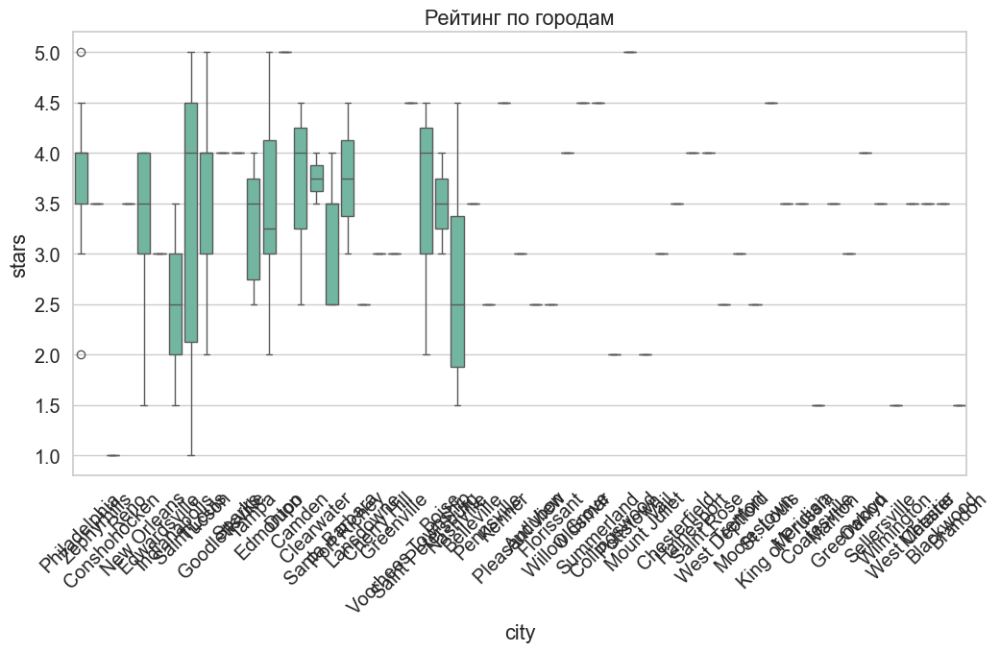

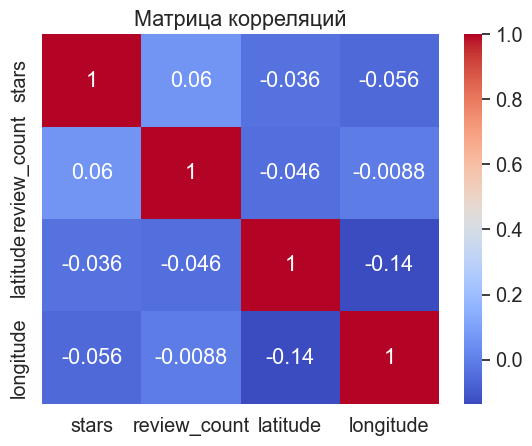

In [6]:
# Pairplot числовых признаков
numerical_data = data_business[['stars', 'review_count', 'latitude', 'longitude']]
sns.pairplot(numerical_data)
plt.show()

# Jointplot: рейтинг vs количество отзывов
sns.jointplot(x='stars', y='review_count', data=data_business, kind='scatter', alpha=0.5)
plt.show()

# Boxplot рейтинга по городам
plt.figure(figsize=(12, 6))
sns.boxplot(x='city', y='stars', data=filtered)
plt.xticks(rotation=45)
plt.title('Рейтинг по городам')
plt.show()

# Heatmap корреляции
corr = numerical_data.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Матрица корреляций')
plt.show()

## `scipy.stats`

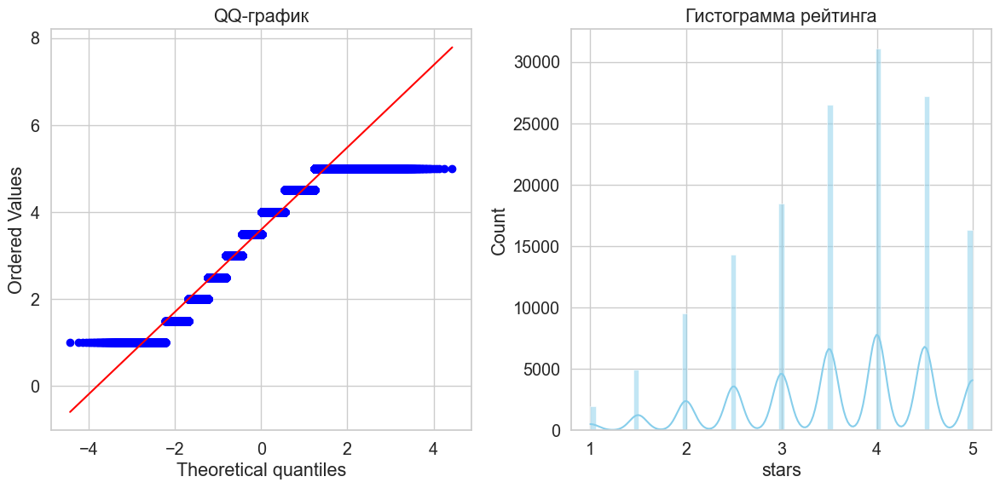

In [7]:
# QQ-график и гистограмма для рейтинга
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
stats.probplot(data_business['stars'], dist='norm', plot=plt)
plt.title('QQ-график')
plt.subplot(1, 2, 2)
sns.histplot(data_business['stars'], kde=True, color='skyblue')
plt.title('Гистограмма рейтинга')
plt.tight_layout()
plt.show()

## `Plotly`

In [8]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Интерактивный точечный график
fig = px.scatter(data_business, x='stars', y='review_count', color='city', 
                 title='Рейтинг vs Отзывы (Plotly)')
fig.show()

In [9]:
# Суб-графики
fig = make_subplots(rows=1, cols=2, subplot_titles=('Гистограмма рейтинга', 'Гистограмма отзывов'))
fig.add_trace(go.Histogram(x=data_business['stars'], name='Рейтинг'), row=1, col=1)
fig.add_trace(go.Histogram(x=data_business['review_count'], name='Отзывы'), row=1, col=2)
fig.update_layout(title_text='Суб-графики')
fig.show()